In [ ]:
#The halogen source gases, often Occur as ozone-depleting substances (ODSs)

In [ ]:
!pip install xarray matplotlib


In [3]:
!pip install cftime

Defaulting to user installation because normal site-packages is not writeable


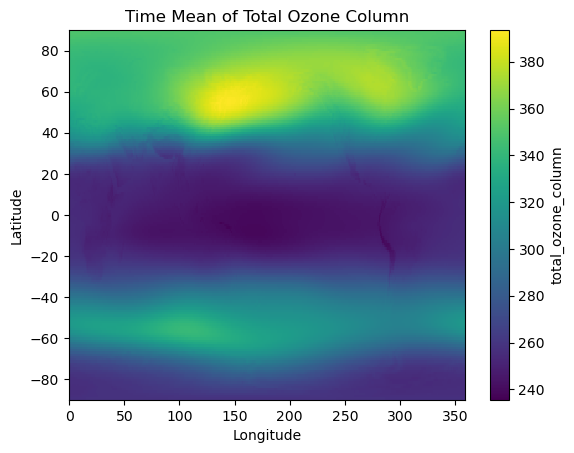

In [5]:
import xarray as xr
import matplotlib.pyplot as plt

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Calculate the time mean of "total_ozone_column"
time_mean = ds['total_ozone_column'].mean(dim='time')

# Plot the time mean
time_mean.plot()
plt.title('Time Mean of Total Ozone Column')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


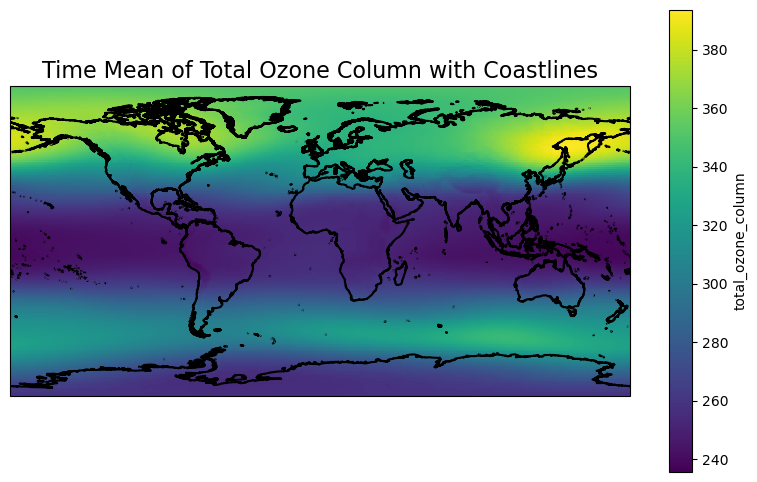

In [10]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Calculate the time mean of "total_ozone_column"
time_mean = ds['total_ozone_column'].mean(dim='time')

# Load the shapefile for coastlines
coastlines = gpd.read_file(r'C:\Users\Subhadeep Maishal\Music\JUP\cyclone_data\ne_10m_coastline\ne_10m_coastline.shp')

# Plot the shapefile (coastlines)
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
coastlines.plot(ax=ax, color='black', edgecolor='black')

# Plot the time mean on top of coastlines
time_mean.plot(ax=ax, cmap='viridis', add_colorbar=True)

# Set the xlim to cover -180 to 180 degrees
ax.set_xlim([-180, 180])

# Enhance the appearance
plt.title('Time Mean of Total Ozone Column with Coastlines', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

plt.show()


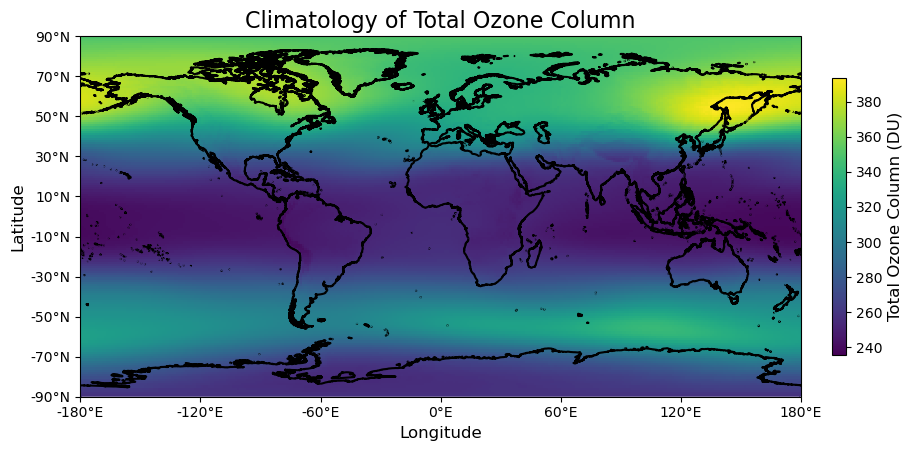

In [17]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Calculate the time mean of "total_ozone_column"
time_mean = ds['total_ozone_column'].mean(dim='time')

# Load the shapefile for coastlines
coastlines = gpd.read_file(r'C:\Users\Subhadeep Maishal\Music\JUP\cyclone_data\ne_10m_coastline\ne_10m_coastline.shp')

# Plot the shapefile (coastlines)
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
coastlines.plot(ax=ax, color='black', edgecolor='black')

# Plot the time mean on top of coastlines
plot = time_mean.plot(ax=ax, cmap='viridis', add_colorbar=False)

# Set the xlim to cover -180 to 180 degrees
ax.set_xlim([-180, 180])

# Add a smaller colorbar with styling and unit
cbar = plt.colorbar(plot, fraction=0.03, pad=0.04, shrink=0.6)
cbar.set_label('Total Ozone Column (DU)', fontsize=12)  # Add units to colorbar label
cbar.ax.tick_params(labelsize=10)

# Set latitude and longitude ticks with a 20-degree interval
ax.set_xticks(range(-180, 181, 60), crs=ccrs.PlateCarree())
ax.set_yticks(range(-90, 91, 20), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x}°E'))
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y}°N'))

# Enhance the appearance
plt.title('Climatology of Total Ozone Column', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

plt.show()


In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Load the shapefile for coastlines
coastlines = gpd.read_file(r'C:\Users\Subhadeep Maishal\Music\JUP\cyclone_data\ne_10m_coastline\ne_10m_coastline.shp')

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
coastlines.plot(ax=ax, color='black', edgecolor='black')

# Set the xlim to cover -180 to 180 degrees
ax.set_xlim([-180, 180])

# Plot the initial frame
plot = ds['total_ozone_column'].isel(time=0).plot(ax=ax, cmap='viridis', add_colorbar=False)
cbar = plt.colorbar(plot, fraction=0.03, pad=0.04, shrink=0.6)
cbar.set_label('Total Ozone Column', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Enhance the appearance
plt.title(f'Total Ozone Column - {ds["time"].values[0]}', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

# Function to update the plot for each frame
def update(frame):
    ax.clear()
    coastlines.plot(ax=ax, color='black', edgecolor='black')
    plot = ds['total_ozone_column'].isel(time=frame).plot(ax=ax, cmap='viridis', add_colorbar=False)
    cbar.set_label('Total Ozone Column', fontsize=12)
    cbar.ax.tick_params(labelsize=10)
    ax.set_xlim([-180, 180])
    plt.title(f'Total Ozone Column - {ds["time"].values[frame]}', fontsize=16)
    plt.xlabel('Longitude', fontsize=12)
    plt.ylabel('Latitude', fontsize=12)

# Create the animation
animation = FuncAnimation(fig, update, frames=len(ds['time']), interval=500)

# Save the animation as a GIF file using Pillow
animation.save('total_ozone_animation.gif', writer='pillow', fps=1)

# Display the animation
HTML(animation.to_jshtml())


In [4]:
!pip install cartopy

['Collecting cartopy',
 "  WARNING: Retrying (Retry(total=4, connect=None, read=None, redirect=None, status=None)) after connection broken by 'ProtocolError('Connection aborted.', ConnectionResetError(10054, 'An existing connection was forcibly closed by the remote host', None, 10054, None))': /packages/bb/50/ab5495dcc22587179134cd37e6534212babeda78e86bda311c37c773f086/Cartopy-0.22.0-cp311-cp311-win_amd64.whl.metadata",
 '  Downloading Cartopy-0.22.0-cp311-cp311-win_amd64.whl.metadata (15 kB)',
 'Requirement already satisfied: numpy>=1.21 in c:\\users\\subhadeep maishal\\anaconda3\\lib\\site-packages (from cartopy) (1.24.3)',
 'Requirement already satisfied: matplotlib>=3.4 in c:\\users\\subhadeep maishal\\anaconda3\\lib\\site-packages (from cartopy) (3.7.2)',
 'Requirement already satisfied: shapely>=1.7 in c:\\users\\subhadeep maishal\\anaconda3\\lib\\site-packages (from cartopy) (2.0.3)',
 'Requirement already satisfied: packaging>=20 in c:\\users\\subhadeep maishal\\anaconda3\\lib\

In [2]:
!pip install geopandas

     ---------------------------------------- 0.0/51.1 kB ? eta -:--:--
     -------- ------------------------------- 10.2/51.1 kB ? eta -:--:--
     --------------- ---------------------- 20.5/51.1 kB 217.9 kB/s eta 0:00:01
     ---------------------- --------------- 30.7/51.1 kB 217.9 kB/s eta 0:00:01
     ------------------------------ ------- 41.0/51.1 kB 245.8 kB/s eta 0:00:01
     ------------------------------ ------- 41.0/51.1 kB 245.8 kB/s eta 0:00:01
     ------------------------------ ------- 41.0/51.1 kB 245.8 kB/s eta 0:00:01
     ------------------------------ ------- 41.0/51.1 kB 245.8 kB/s eta 0:00:01
     ------------------------------ ------- 41.0/51.1 kB 245.8 kB/s eta 0:00:01
     -------------------------------------- 51.1/51.1 kB 124.6 kB/s eta 0:00:00
   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   -- ------------------------------------- 0.1/1.1 MB 3.2 MB/s eta 0:00:01
   ---- ----------------------------------- 0.1/1.1 MB 1.4 MB/s eta 0:

In [ ]:
!pip install scikit-misc


In [17]:
!pip install netCDF4

   ---------------------------------------- 0.0/6.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/6.6 MB 1.4 MB/s eta 0:00:05
    --------------------------------------- 0.1/6.6 MB 1.1 MB/s eta 0:00:07
   - -------------------------------------- 0.2/6.6 MB 1.7 MB/s eta 0:00:04
   -- ------------------------------------- 0.4/6.6 MB 2.3 MB/s eta 0:00:03
   --- ------------------------------------ 0.5/6.6 MB 2.5 MB/s eta 0:00:03
   ----- ---------------------------------- 1.0/6.6 MB 4.0 MB/s eta 0:00:02
   ------- -------------------------------- 1.2/6.6 MB 4.6 MB/s eta 0:00:02
   ------- -------------------------------- 1.3/6.6 MB 4.0 MB/s eta 0:00:02
   -------- ------------------------------- 1.3/6.6 MB 3.7 MB/s eta 0:00:02
   -------- ------------------------------- 1.4/6.6 MB 3.5 MB/s eta 0:00:02
   --------------- ------------------------ 2.5/6.6 MB 5.5 MB/s eta 0:00:01
   ---------------------- ----------------- 3.7/6.6 MB 7.7 MB/s eta 0:00:01
   ----------------

In [2]:
!pip install cftime


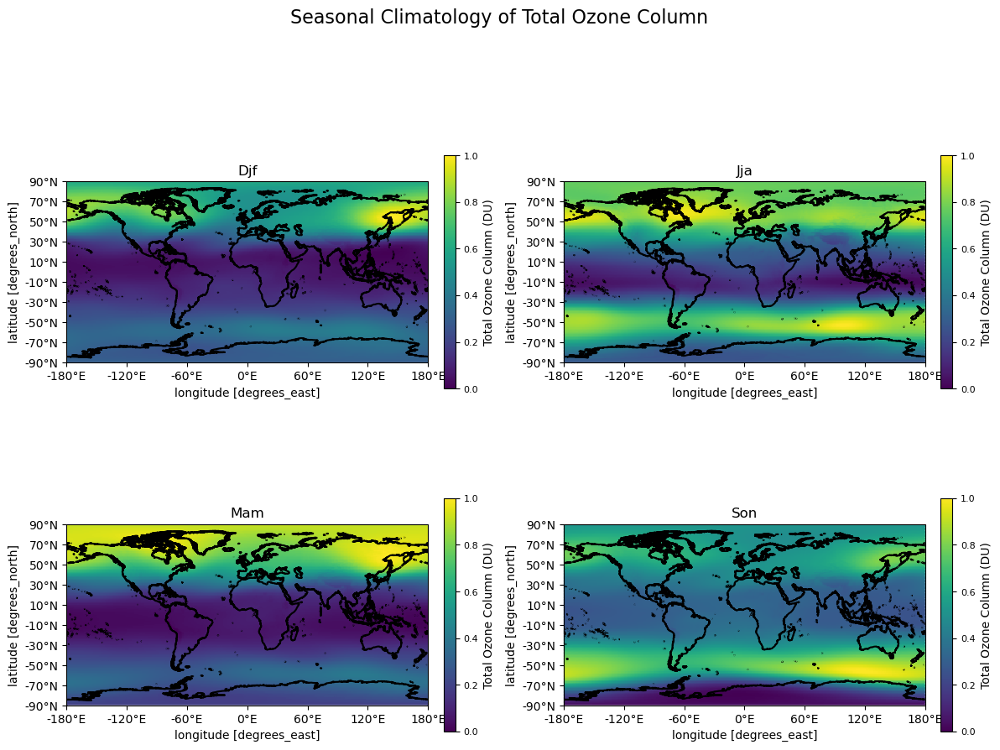

In [8]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1970-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Calculate the seasonal mean of "total_ozone_column"
seasonal_mean = ds['total_ozone_column'].groupby('time.season').mean(dim='time')

# Load the shapefile for coastlines
coastlines = gpd.read_file(r'C:\Users\Subhadeep Maishal\Music\JUP\cyclone_data\ne_10m_coastline\ne_10m_coastline.shp')

# Create a 2x2 subplot for each season
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

# Plot each season on a separate subplot
for ax, (season, data) in zip(axes, seasonal_mean.groupby('season')):
    coastlines.plot(ax=ax, color='black', edgecolor='black')
    data.plot(ax=ax, cmap='viridis', add_colorbar=False)
    ax.set_title(season.capitalize())
    ax.set_xlim([-180, 180])

    # Set latitude and longitude ticks with a 20-degree interval
    ax.set_xticks(range(-180, 181, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(range(-90, 91, 20), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x}°E'))
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y}°N'))

    # Add a colorbar with styling and unit
    cbar = plt.colorbar(ax.collections[0], ax=ax, fraction=0.03, pad=0.04, shrink=0.6)
    cbar.set_label('Total Ozone Column (DU)', fontsize=10)  # Add units to colorbar label
    cbar.ax.tick_params(labelsize=8)

# Enhance the appearance
plt.suptitle('Seasonal Climatology of Total Ozone Column', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to avoid overlapping titles

plt.show()


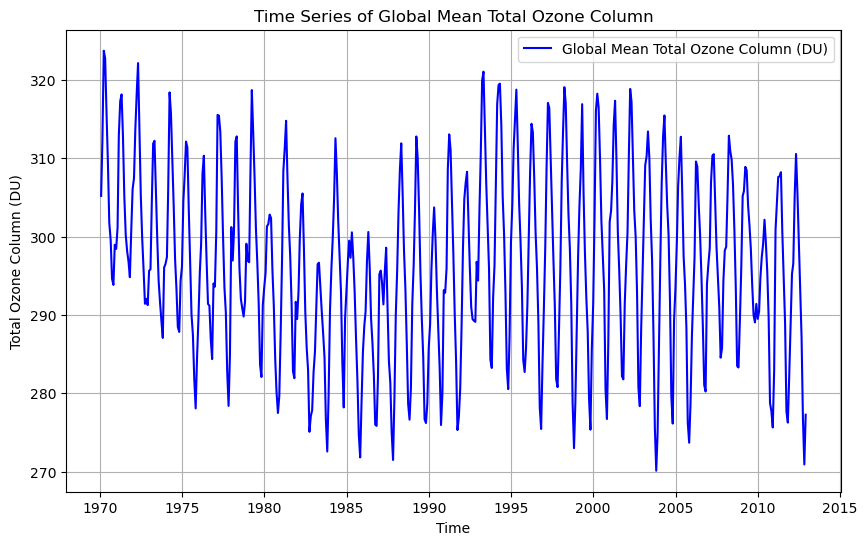

In [22]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1970-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Calculate the global mean of total_ozone_column for each time step
global_mean = ds['total_ozone_column'].mean(dim=('lat', 'lon'))

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(ds['time'], global_mean, label='Global Mean Total Ozone Column (DU)', color='blue')
plt.xlabel('Time')
plt.ylabel('Total Ozone Column (DU)')
plt.title('Time Series of Global Mean Total Ozone Column')
plt.legend()
plt.grid(True)
plt.show()


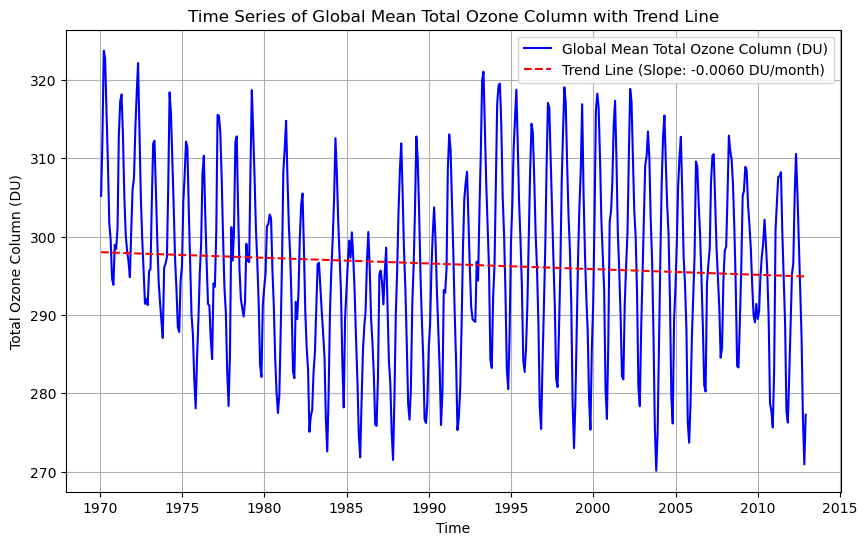

In [23]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1970-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Calculate the global mean of total_ozone_column for each time step
global_mean = ds['total_ozone_column'].mean(dim=('lat', 'lon'))

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(ds['time'], global_mean, label='Global Mean Total Ozone Column (DU)', color='blue')

# Add a trend line
coefficients = np.polyfit(range(len(ds['time'])), global_mean, 1)
trend_line = np.polyval(coefficients, range(len(ds['time'])))
plt.plot(ds['time'], trend_line, label=f'Trend Line (Slope: {coefficients[0]:.4f} DU/month)', color='red', linestyle='--')

plt.xlabel('Time')
plt.ylabel('Total Ozone Column (DU)')
plt.title('Time Series of Global Mean Total Ozone Column with Trend Line')
plt.legend()
plt.grid(True)
plt.show()


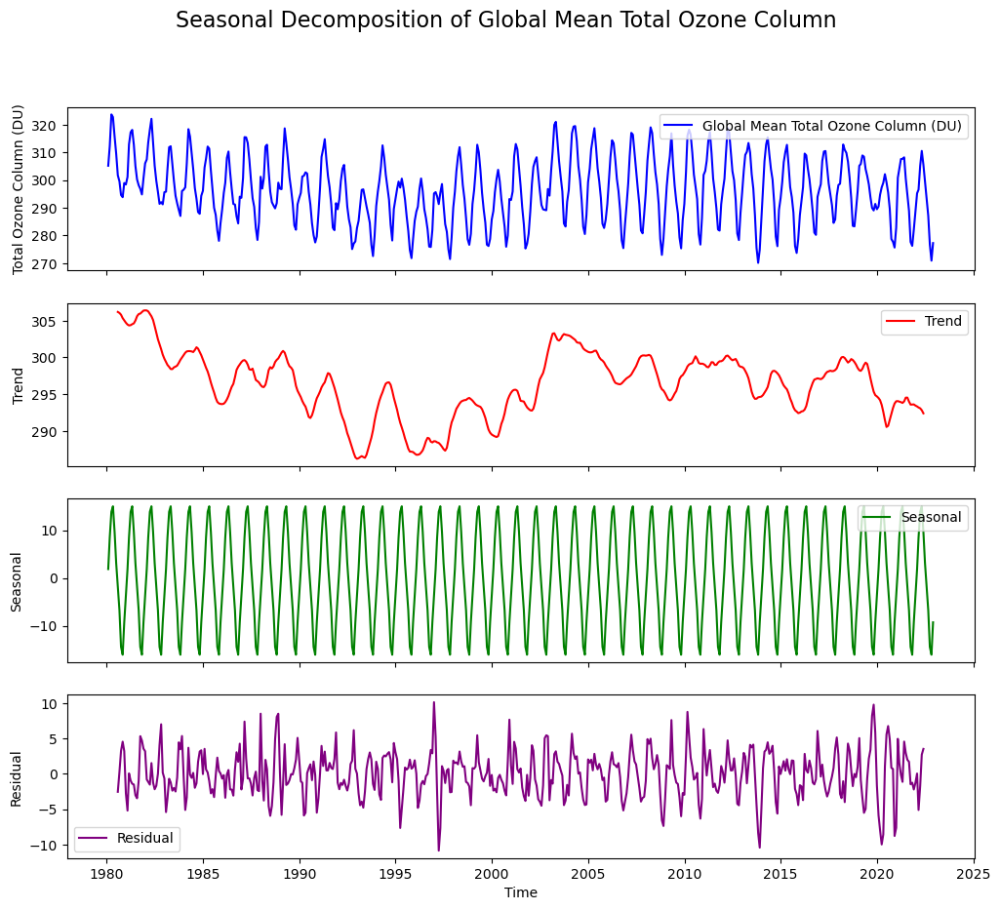

In [29]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Calculate the global mean of total_ozone_column for each time step
global_mean = ds['total_ozone_column'].mean(dim=('lat', 'lon'))

# Decompose the time series into trend, seasonal, and residual components
result = sm.tsa.seasonal_decompose(global_mean, period=12)  # Assuming monthly data with a period of 12

# Plotting
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 10), sharex=True)

ax1.plot(ds['time'], global_mean, label='Global Mean Total Ozone Column (DU)', color='blue')
ax1.set_ylabel('Total Ozone Column (DU)')
ax1.legend()

ax2.plot(ds['time'], result.trend, label='Trend', color='red')
ax2.set_ylabel('Trend')
ax2.legend()

ax3.plot(ds['time'], result.seasonal, label='Seasonal', color='green')
ax3.set_ylabel('Seasonal')
ax3.legend()

ax4.plot(ds['time'], result.resid, label='Residual', color='purple')
ax4.set_xlabel('Time')
ax4.set_ylabel('Residual')
ax4.legend()

plt.suptitle('Seasonal Decomposition of Global Mean Total Ozone Column', fontsize=16)
plt.show()


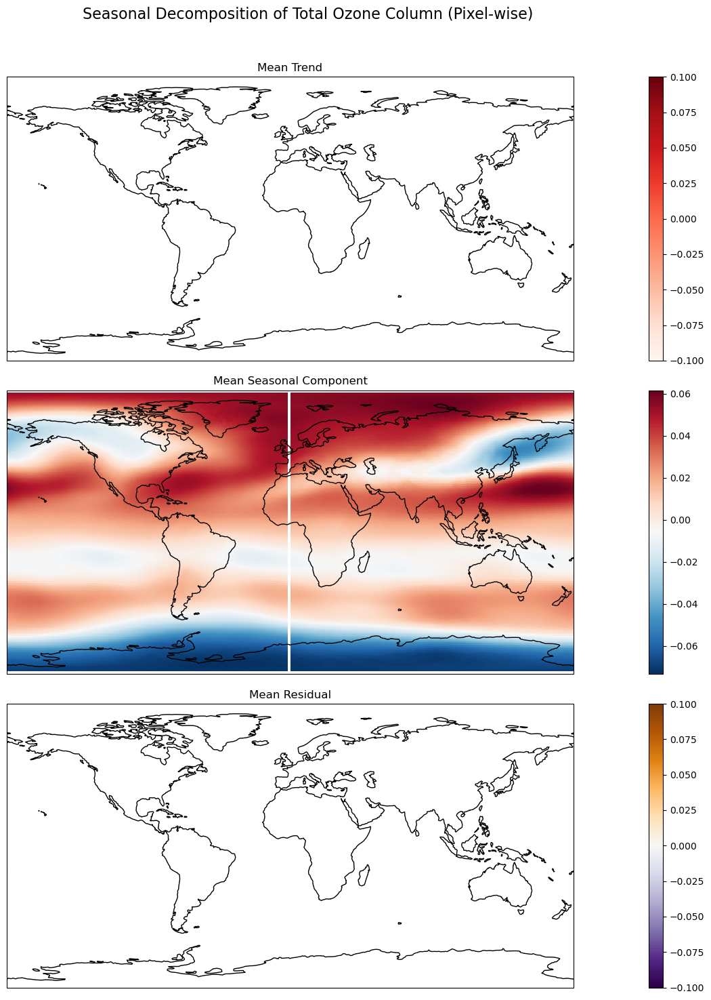

In [33]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Initialize arrays to store decomposed components
trend_array = np.zeros_like(ds['total_ozone_column'].values)
seasonal_array = np.zeros_like(ds['total_ozone_column'].values)
resid_array = np.zeros_like(ds['total_ozone_column'].values)

# Decompose the time series into trend, seasonal, and residual components pixel-wise
for i in range(ds['lat'].size):
    for j in range(ds['lon'].size):
        result_pixel_wise = sm.tsa.seasonal_decompose(ds['total_ozone_column'][:, i, j], period=12)
        trend_array[:, i, j] = result_pixel_wise.trend
        seasonal_array[:, i, j] = result_pixel_wise.seasonal
        resid_array[:, i, j] = result_pixel_wise.resid

# Plotting spatial maps for each component
fig, axes = plt.subplots(3, 1, figsize=(12, 15), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot mean trend
im0 = axes[0].imshow(np.mean(trend_array, axis=0), cmap='Reds', extent=(ds['lon'].min(), ds['lon'].max(), ds['lat'].min(), ds['lat'].max()), origin='lower')
axes[0].set_title('Mean Trend')
axes[0].coastlines()

# Plot mean seasonal component
im1 = axes[1].imshow(np.mean(seasonal_array, axis=0), cmap='RdBu_r', extent=(ds['lon'].min(), ds['lon'].max(), ds['lat'].min(), ds['lat'].max()), origin='lower')
axes[1].set_title('Mean Seasonal Component')
axes[1].coastlines()

# Plot mean residual
im2 = axes[2].imshow(np.mean(resid_array, axis=0), cmap='PuOr_r', extent=(ds['lon'].min(), ds['lon'].max(), ds['lat'].min(), ds['lat'].max()), origin='lower')
axes[2].set_title('Mean Residual')
axes[2].coastlines()

# Add colorbars
cbar0 = fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.02, pad=0.1)
cbar1 = fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.02, pad=0.1)
cbar2 = fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.02, pad=0.1)

plt.suptitle('Seasonal Decomposition of Total Ozone Column (Pixel-wise)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


C:\Users\Subhadeep Maishal\AppData\Local\Temp\ipykernel_9824\1386512460.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


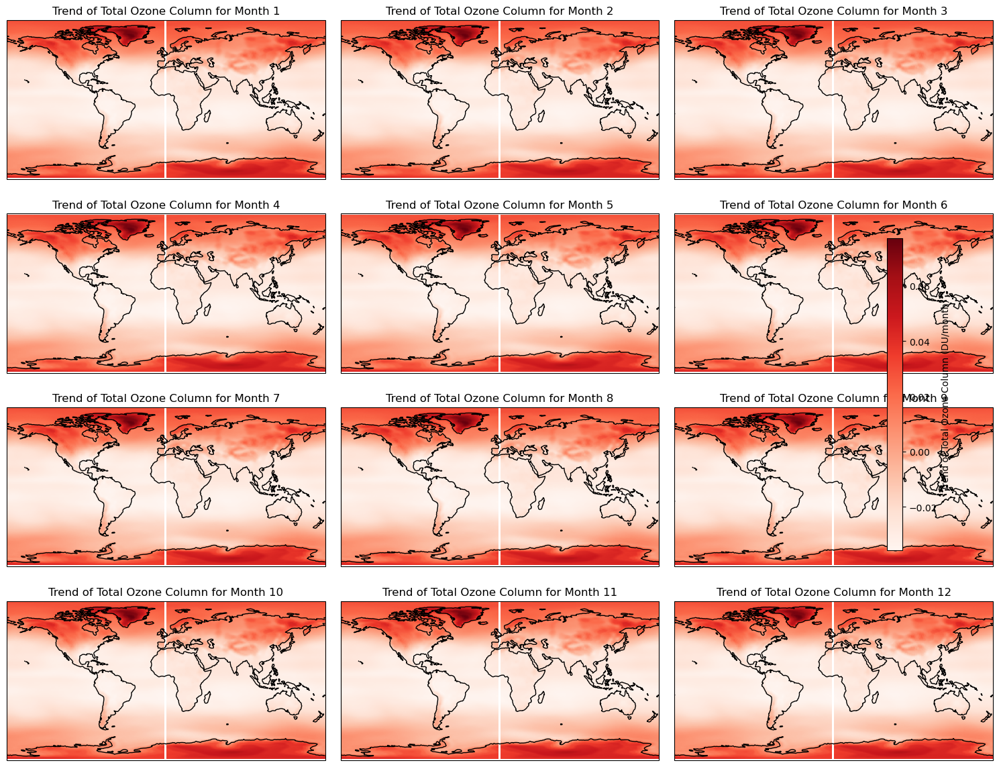

In [35]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
import cartopy.crs as ccrs

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Initialize array to store trend component per month
trend_array = np.zeros_like(ds['total_ozone_column'].values)

# Calculate the linear trend pixel-wise
for i in range(ds['lat'].size):
    for j in range(ds['lon'].size):
        y = ds['total_ozone_column'][:, i, j].values
        x = np.arange(len(y))
        X = sm.add_constant(x)
        model = sm.OLS(y, X)
        results = model.fit()
        trend_array[:, i, j] = results.params[1]  # Slope of the linear trend

# Plotting spatial maps for the trend
fig, axes = plt.subplots(4, 3, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

for month in range(1, 13):
    ax = axes[month-1]
    im = ax.imshow(trend_array[month-1, :, :], cmap='Reds', extent=(ds['lon'].min(), ds['lon'].max(), ds['lat'].min(), ds['lat'].max()), origin='lower')
    ax.set_title(f'Trend of Total Ozone Column for Month {month}')
    ax.coastlines()

# Add colorbar
cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.02, pad=0.1)
cbar.set_label('Trend of Total Ozone Column (DU/month)')

plt.tight_layout()
plt.show()


In [ ]:
#COME NEXT IMPROVE THE LAYOUT $SM_FALCO! ;-)  WE TOGETHER    

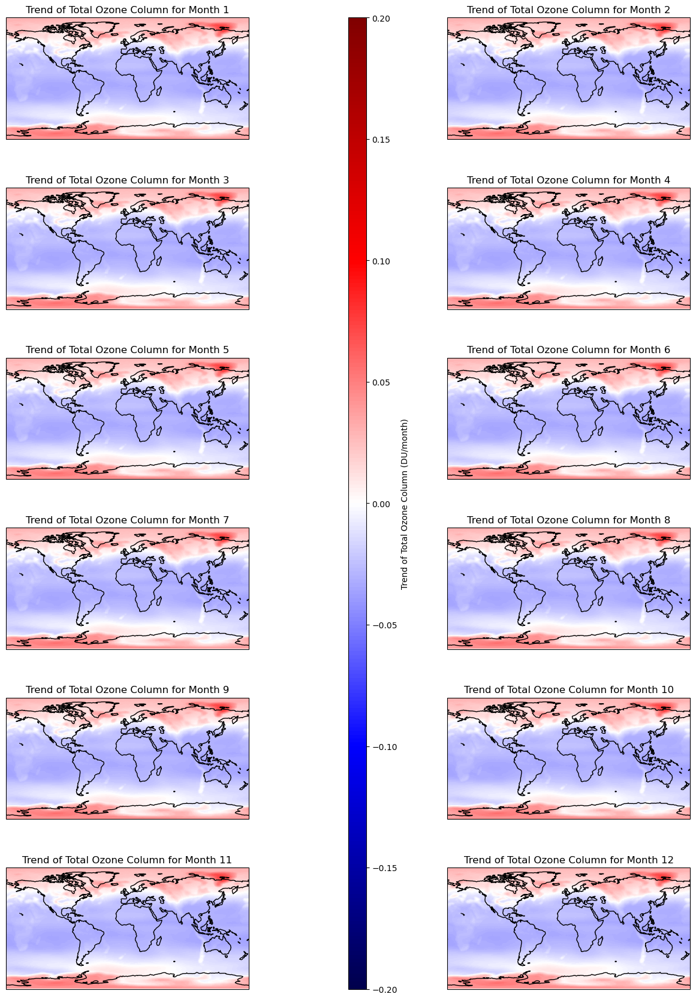

In [43]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Initialize array to store trend component per month
trend_array = np.zeros_like(ds['total_ozone_column'].values[0, :, :])

# Calculate the linear trend per month pixel-wise
for i in range(ds['lat'].size):
    for j in range(ds['lon'].size):
        slope, _, _, _, _ = linregress(np.arange(len(ds['time'])), ds['total_ozone_column'][:, i, j])
        trend_array[i, j] = slope

# Plotting spatial maps for the trend
fig, axes = plt.subplots(6, 2, figsize=(15, 18), subplot_kw={'projection': ccrs.PlateCarree()})
cbar_ax = fig.add_axes([0.5, 0.05, 0.02, 0.9])  # Define position for the colorbar

axes = axes.flatten()

for month in range(1, 13):
    ax = axes[month-1]
    im = ax.imshow(trend_array, cmap='seismic', extent=(-180, 180, -90, 90), origin='lower', vmin=-0.2, vmax=0.2)
    ax.set_title(f'Trend of Total Ozone Column for Month {month}')
    ax.coastlines()

# Add colorbar
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
cbar.set_label('Trend of Total Ozone Column (DU/month)')

# Manually adjust layout to avoid the warning
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)

plt.show()


In [ ]:
# NOW COME NEXT CHECK ITS SIGNI:) OR NOT    abave fig have -180 to 180 issues :) Best@fishy

C:\Users\Subhadeep Maishal\AppData\Local\Temp\ipykernel_9824\1275102026.py:42: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  rect = plt.Rectangle((lon - 0.5, lat - 0.5), 1, 1, color='none', edgecolor='black', linewidth=0.5, hatch='//')


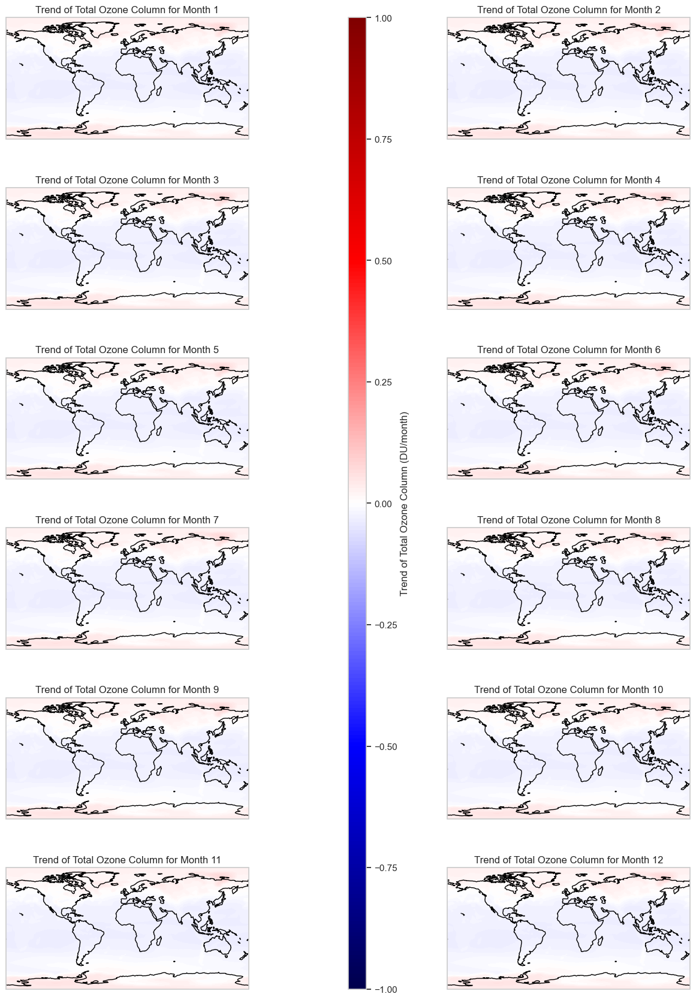

In [88]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Initialize array to store trend component per month
trend_array = np.zeros_like(ds['total_ozone_column'].values[0, :, :])
p_values = np.zeros_like(ds['total_ozone_column'].values[0, :, :])

# Calculate the linear trend per month pixel-wise
for i in range(ds['lat'].size):
    for j in range(ds['lon'].size):
        slope, intercept, r_value, p_value, std_err = linregress(np.arange(len(ds['time'])), ds['total_ozone_column'][:, i, j])
        trend_array[i, j] = slope
        p_values[i, j] = p_value

# Plotting spatial maps for the trend with significance and hatching
fig, axes = plt.subplots(6, 2, figsize=(15, 18), subplot_kw={'projection': ccrs.PlateCarree()})
cbar_ax = fig.add_axes([0.5, 0.05, 0.02, 0.9])  # Define position for the colorbar

axes = axes.flatten()

for month in range(1, 13):
    ax = axes[month-1]
    im = ax.imshow(trend_array, cmap='seismic', extent=(-180, 180, -90, 90), origin='lower', vmin=-1, vmax=1)
    ax.set_title(f'Trend of Total Ozone Column for Month {month}')

    # Add significance markers with hatching based on p-values
    sig_pixels = np.where(p_values < 0.05)
    for lon, lat in zip(ds['lon'][sig_pixels[1]], ds['lat'][sig_pixels[0]]):
        rect = plt.Rectangle((lon - 0.5, lat - 0.5), 1, 1, color='none', edgecolor='black', linewidth=0.5, hatch='//')
        ax.add_patch(rect)

    ax.coastlines()

# Add colorbar
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
cbar.set_label('Trend of Total Ozone Column (DU/month)')

# Manually adjust layout to avoid the warning
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)

plt.show()


In [ ]:
# REALLY THERE HAVE NO OZONE DEPLETION! THERE. IN YOUR BlACK-BACK SIGHT JPL*. AGAIN THEY CALL TO fix ODS IN TROPICS

In [89]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
ds = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(ds['time']), freq='M')
ds['time'] = xr.DataArray(time_values, dims='time')

# Initialize array to store trend component per month
trend_array = np.zeros_like(ds['total_ozone_column'].values[0, :, :])
p_values = np.zeros_like(ds['total_ozone_column'].values[0, :, :])

# Calculate the linear trend per month pixel-wise
for i in range(ds['lat'].size):
    for j in range(ds['lon'].size):
        slope, intercept, r_value, p_value, std_err = linregress(np.arange(len(ds['time'])), ds['total_ozone_column'][:, i, j])
        trend_array[i, j] = slope
        p_values[i, j] = p_value

# Plotting spatial maps for the trend with significance and hatching
fig, axes = plt.subplots(6, 2, figsize=(15, 18), subplot_kw={'projection': ccrs.PlateCarree()})
cbar_ax = fig.add_axes([0.5, 0.05, 0.02, 0.9])  # Define position for the colorbar

axes = axes.flatten()

for month in range(1, 13):
    ax = axes[month-1]
    im = ax.imshow(trend_array, cmap='seismic', extent=(-180, 180, -90, 90), origin='lower', vmin=-1, vmax=1)
    ax.set_title(f'Trend of Total Ozone Column for Month {month}')

    # Add significance markers with hatching based on p-values
sig_pixels = np.where(p_values < 0.05)
for lon, lat in zip(ds['lon'][sig_pixels[1]], ds['lat'][sig_pixels[0]]):
    rect = plt.Rectangle((lon - 0.5, lat - 0.5), 1, 1, color='none', edgecolor='black', linewidth=0.5, hatch='//')
    ax.add_patch(rect)

    ax.coastlines()

# Add colorbar
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
cbar.set_label('Trend of Total Ozone Column (DU/month)')

# Manually adjust layout to avoid the warning
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)

# Add a legend for hatching
legend = fig.legend([sc], ['Significant'], loc='upper right', bbox_to_anchor=(1.07, 0.9), fontsize='small')

plt.show()


C:\Users\Subhadeep Maishal\AppData\Local\Temp\ipykernel_9824\3066572982.py:42: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  rect = plt.Rectangle((lon - 0.5, lat - 0.5), 1, 1, color='none', edgecolor='black', linewidth=0.5, hatch='//')


KeyboardInterrupt: 

In [ ]:
# its wrong! abouve plot is correct! i have any issues with U! but it's depend on variability of https://g.co/kgs/5RtmDBv

In [ ]:
!install seaborn

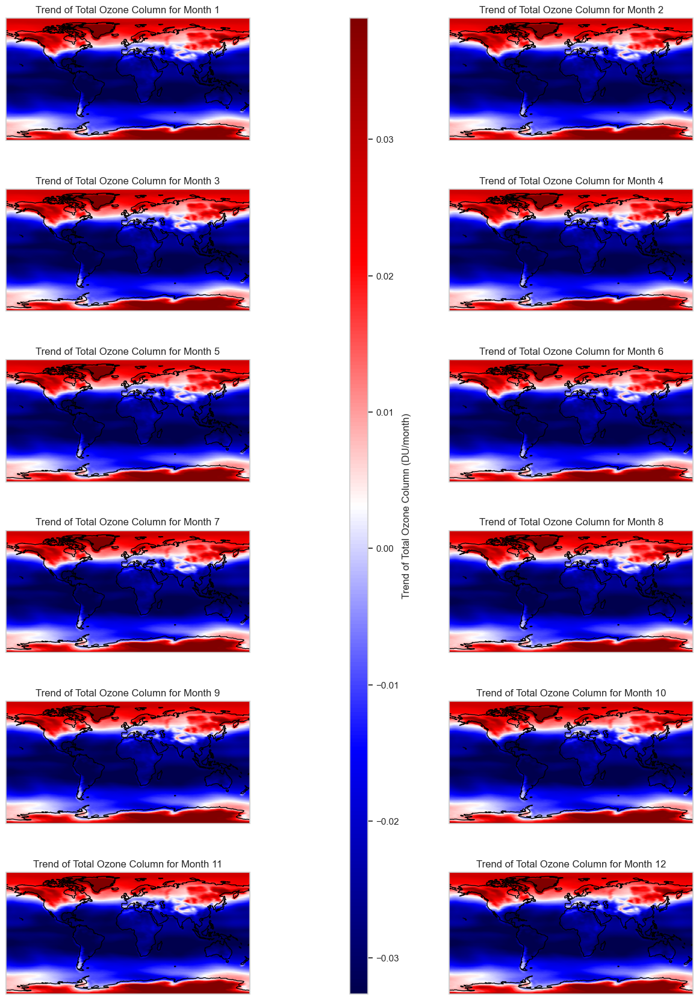

In [74]:
import numpy as np
import pandas as pd
import xarray as xr
from scipy import stats
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual_f = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
x_f = np.arange(1, len(oz_annual_f['time']) + 1)

# Initialize arrays to store trend components
oz_grd_f = oz_annual_f['total_ozone_column'].values
nt_f, nlat_f, nlon_f = oz_grd_f.shape
oz_rate_f = np.empty((nlat_f, nlon_f))

# Calculate linear trend pixel-wise
for i in range(nlat_f):
    for j in range(nlon_f):
        y = oz_grd_f[:, i, j]
        slope, _, _, _, _ = stats.linregress(x_f, y)
        oz_rate_f[i, j] = slope

# Convert to GeoDataFrame for easy plotting with geopandas
lon_2d, lat_2d = np.meshgrid(oz_annual_f['lon'], oz_annual_f['lat'])
gdf = gpd.GeoDataFrame(geometry=gpd.points_from_xy(lon_2d.flatten(), lat_2d.flatten()))
gdf['oz_rate'] = oz_rate_f.flatten()

# Set seaborn style
sns.set(style="whitegrid", palette="viridis")

# Plotting spatial maps for the trend
fig, axes = plt.subplots(6, 2, figsize=(15, 18), subplot_kw={'projection': ccrs.PlateCarree()})
cbar_ax = fig.add_axes([0.5, 0.05, 0.02, 0.9])  # Define position for the colorbar

axes = axes.flatten()

# Automatically adjust color range based on the calculated trends
vmin, vmax = np.percentile(oz_rate_f, [5, 95])

for month in range(1, 13):
    ax = axes[month-1]
    im = ax.scatter(gdf['geometry'].x, gdf['geometry'].y, c=gdf['oz_rate'], cmap='seismic', vmin=vmin, vmax=vmax, s=20)
    ax.set_title(f'Trend of Total Ozone Column for Month {month}')
    ax.coastlines()

# Add colorbar without the label
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
cbar.set_label('Trend of Total Ozone Column (DU/month)')

# Manually adjust layout to avoid the warning
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)

plt.show()


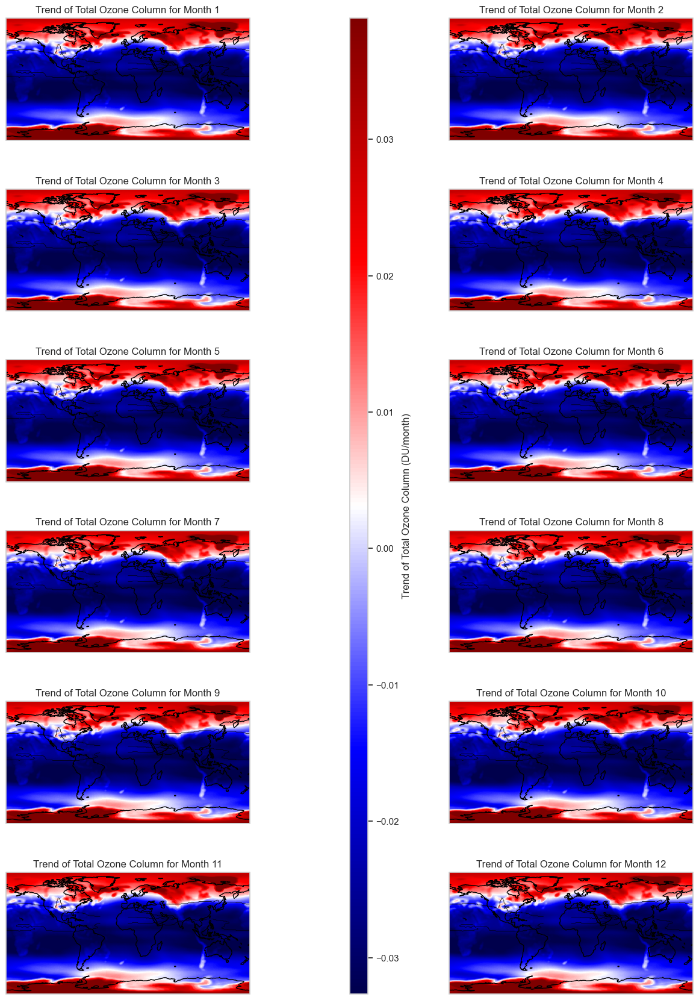

In [79]:
import numpy as np
import pandas as pd
import xarray as xr
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual_f = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
x_f = np.arange(1, len(oz_annual_f['time']) + 1)

# Initialize arrays to store trend components and p-values
oz_grd_f = oz_annual_f['total_ozone_column'].values
nt_f, nlat_f, nlon_f = oz_grd_f.shape
oz_rate_f = np.empty((nlat_f, nlon_f))
p_values_f = np.empty((nlat_f, nlon_f))

# Calculate linear trend and p-values pixel-wise
for i in range(nlat_f):
    for j in range(nlon_f):
        y = oz_grd_f[:, i, j]
        slope, _, _, p_value, _ = stats.linregress(x_f, y)
        oz_rate_f[i, j] = slope
        p_values_f[i, j] = p_value

# Plotting spatial maps for the trend with hatching
fig, axes = plt.subplots(6, 2, figsize=(15, 18), subplot_kw={'projection': ccrs.PlateCarree()})
cbar_ax = fig.add_axes([0.5, 0.05, 0.02, 0.9])  # Define position for the colorbar

axes = axes.flatten()

# Automatically adjust color range based on the calculated trends
vmin, vmax = np.percentile(oz_rate_f, [5, 95])

for month in range(1, 13):
    ax = axes[month-1]
    im = ax.imshow(oz_rate_f, cmap='seismic', extent=(-180, 180, -90, 90), origin='lower', vmin=vmin, vmax=vmax)
    ax.set_title(f'Trend of Total Ozone Column for Month {month}')

    # Overlay hatching for significance
    ax.contour(p_values_f < 0.05, colors='black', linewidths=0.5, levels=[0.5])

    ax.coastlines()

# Add colorbar without the label
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
cbar.set_label('Trend of Total Ozone Column (DU/month)')

# Manually adjust layout to avoid the warning
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)

plt.show()


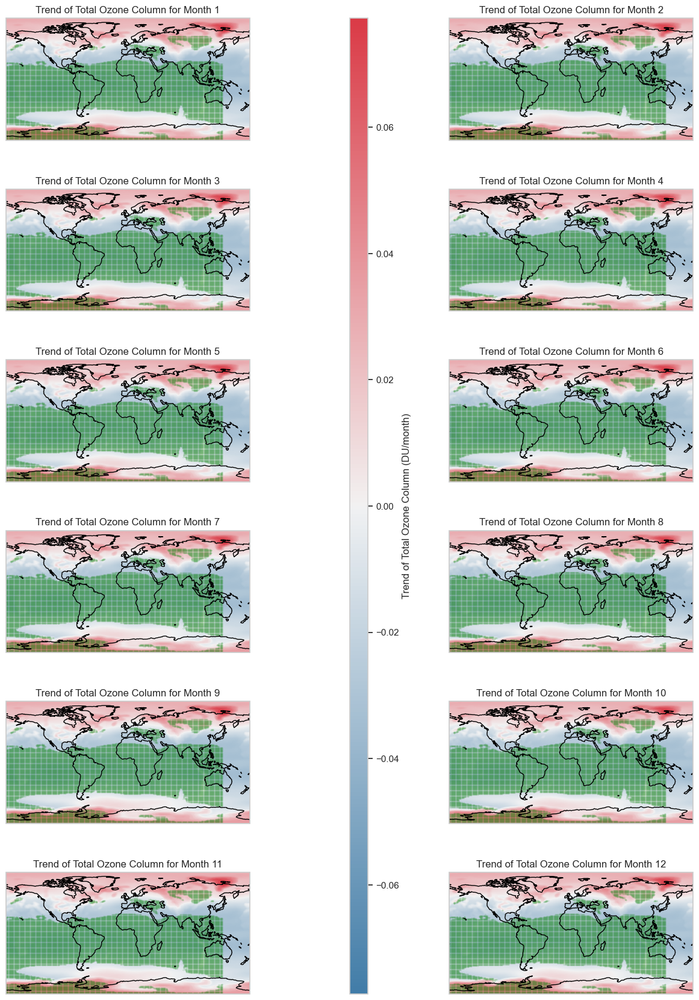

In [87]:
import numpy as np
import pandas as pd
import xarray as xr
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual_f = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
x_f = np.arange(1, len(oz_annual_f['time']) + 1)

# Initialize arrays to store trend components and p-values
oz_grd_f = oz_annual_f['total_ozone_column'].values
nt_f, nlat_f, nlon_f = oz_grd_f.shape
oz_rate_f = np.empty((nlat_f, nlon_f))
p_values_f = np.empty((nlat_f, nlon_f))

# Calculate linear trend and p-values pixel-wise
for i in range(nlat_f):
    for j in range(nlon_f):
        y = oz_grd_f[:, i, j]
        slope, _, _, p_value, _ = stats.linregress(x_f, y)
        oz_rate_f[i, j] = slope
        p_values_f[i, j] = p_value

# Plotting spatial maps for the trend with hatching and points overlay
fig, axes = plt.subplots(6, 2, figsize=(15, 18), subplot_kw={'projection': ccrs.PlateCarree()})
cbar_ax = fig.add_axes([0.5, 0.05, 0.02, 0.9])  # Define position for the colorbar

axes = axes.flatten()

# Create a diverging colormap using seaborn
cmap = sns.diverging_palette(240, 10, as_cmap=True)

for month in range(1, 13):
    ax = axes[month-1]
    im = ax.imshow(oz_rate_f, cmap=cmap, extent=(-180, 180, -90, 90), origin='lower', vmin=-np.max(np.abs(oz_rate_f)), vmax=np.max(np.abs(oz_rate_f)))
    ax.set_title(f'Trend of Total Ozone Column for Month {month}')

    # Overlay hatching for significance   For PRO -------;-)
    # ax.contour(p_values_f < 0.05, colors='black', linewidths=0.5, levels=[0.5])

    # Overlay points for significant trends
    sig_pixels = np.where(p_values_f < 0.05)
    ax.scatter(sig_pixels[1] - 180, sig_pixels[0] - 90, color='green', marker='o', s=0.01)

    ax.coastlines()

# Add colorbar without the label
cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
cbar.set_label('Trend of Total Ozone Column (DU/month)')

# Manually adjust layout to avoid the warning
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)

plt.show()


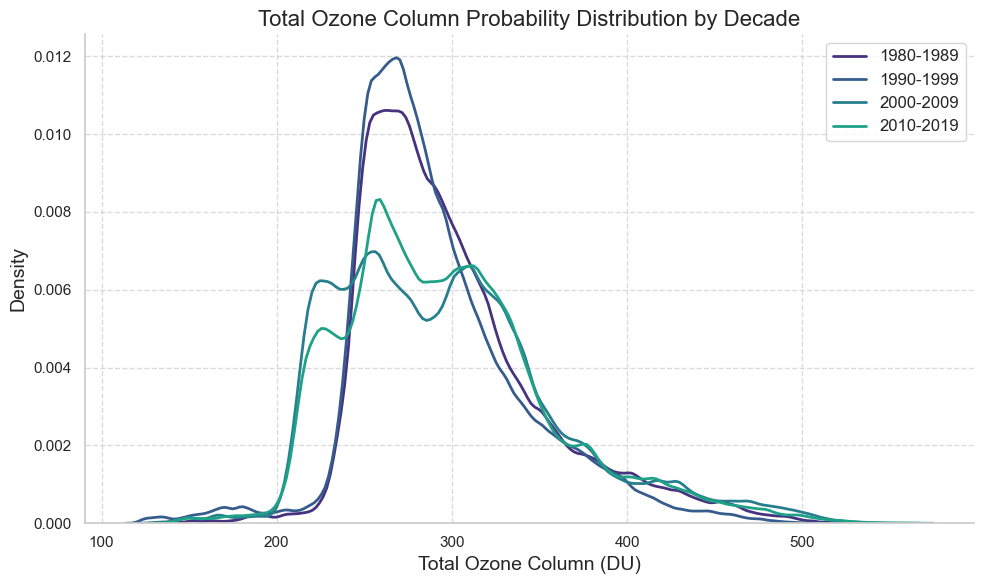

In [96]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(oz_annual['time']), freq='M')
oz_annual['time'] = xr.DataArray(time_values, dims='time')

# Define a function to extract the decade from a numeric year
def get_decade(year):
    return (year // 10) * 10

# Apply the function to each year in the dataset
oz_annual['decade'] = get_decade(oz_annual['time'].dt.year)

# Split time by decade
oz_decades = [oz_annual.sel(time=slice(f'{start}-01-01', f'{start + 9}-12-31')) for start in range(1980, 2020, 10)]

# Plot probability distribution curves for each decade
fig, ax = plt.subplots(figsize=(10, 6))

# KDE for each decade
for decade in oz_decades:
    data = decade['total_ozone_column'].values.flatten()
    start_year, end_year = int(decade['time'][0].dt.year), int(decade['time'][-1].dt.year)
    label = f'{start_year}-{end_year}'
    sns.kdeplot(data, label=label, ax=ax, linewidth=2)

# Set plot aesthetics
ax.set_title('Total Ozone Column Probability Distribution by Decade', fontsize=16)
ax.set_xlabel('Total Ozone Column (DU)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Beautify the plot
sns.despine()
plt.tight_layout()

# Display the plot
plt.show()


In [ ]:
# MAKE IT MORE Gorgeous :)    no its not Taylor Swift  ;-)

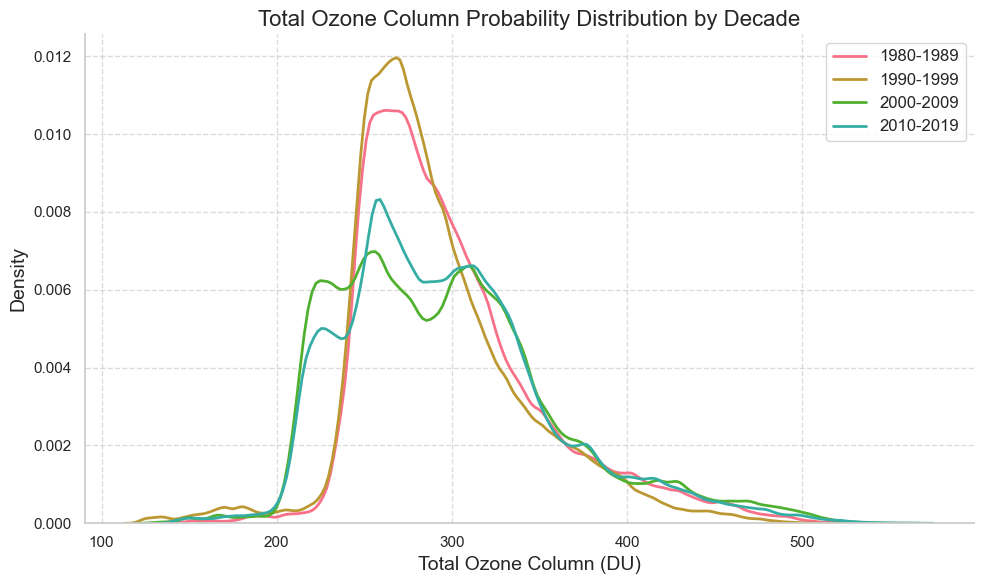

In [101]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(oz_annual['time']), freq='M')
oz_annual['time'] = xr.DataArray(time_values, dims='time')

# Define a function to extract the decade from a numeric year
def get_decade(year):
    return (year // 10) * 10

# Apply the function to each year in the dataset
oz_annual['decade'] = get_decade(oz_annual['time'].dt.year)

# Split time by decade
oz_decades = [oz_annual.sel(time=slice(f'{start}-01-01', f'{start + 9}-12-31')) for start in range(1980, 2020, 10)]

# Set a custom color palette for seaborn
sns.set_palette("husl")

# Plot probability distribution curves for each decade
fig, ax = plt.subplots(figsize=(10, 6))

# KDE for each decade
for decade in oz_decades:
    data = decade['total_ozone_column'].values.flatten()
    start_year, end_year = int(decade['time'][0].dt.year), int(decade['time'][-1].dt.year)
    label = f'{start_year}-{end_year}'
    sns.kdeplot(data, label=label, ax=ax, linewidth=2)

# Set plot aesthetics
ax.set_title('Total Ozone Column Probability Distribution', fontsize=16)
ax.set_xlabel('Total Ozone Column (DU)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Beautify the plot
sns.despine()
plt.tight_layout()

# Display the plot
plt.show()


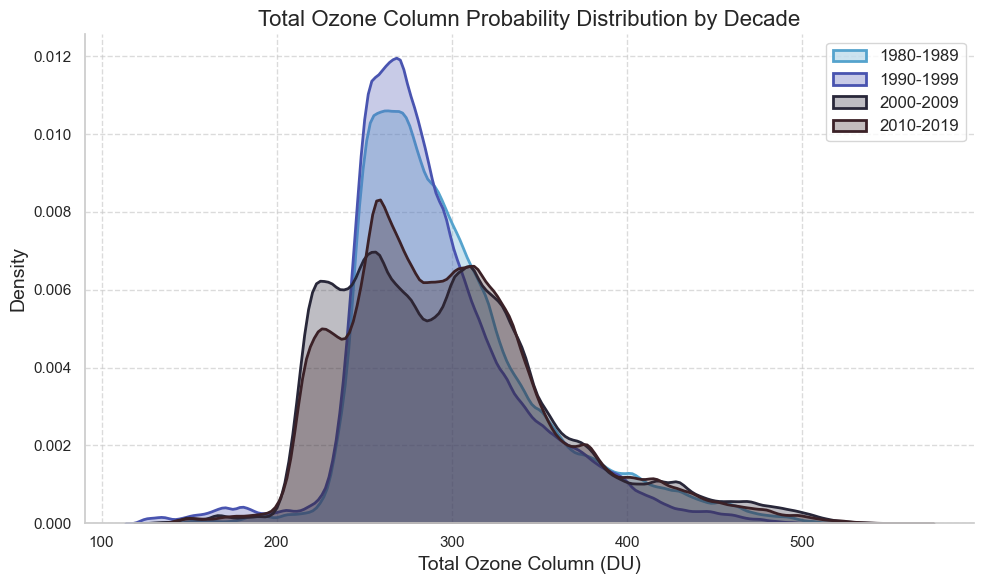

In [103]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(oz_annual['time']), freq='M')
oz_annual['time'] = xr.DataArray(time_values, dims='time')

# Define a function to extract the decade from a numeric year
def get_decade(year):
    return (year // 10) * 10

# Apply the function to each year in the dataset
oz_annual['decade'] = get_decade(oz_annual['time'].dt.year)

# Split time by decade
oz_decades = [oz_annual.sel(time=slice(f'{start}-01-01', f'{start + 9}-12-31')) for start in range(1980, 2020, 10)]

# Set a custom color palette for seaborn
sns.set_palette("icefire")

# Plot probability distribution curves for each decade
fig, ax = plt.subplots(figsize=(10, 6))

# KDE for each decade with shaded areas
for decade in oz_decades:
    data = decade['total_ozone_column'].values.flatten()
    start_year, end_year = int(decade['time'][0].dt.year), int(decade['time'][-1].dt.year)
    label = f'{start_year}-{end_year}'
    sns.kdeplot(data, label=label, ax=ax, linewidth=2, fill=True, alpha=0.3)

# Set plot aesthetics
ax.set_title('Total Ozone Column Probability Distribution by Decade', fontsize=16)
ax.set_xlabel('Total Ozone Column (DU)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Beautify the plot
sns.despine()
plt.tight_layout()

# Display the plot
plt.show()


In [ ]:
# "OH" YOU REALY LIKE HUE     (Really" is an adverb used to emphasize a statement or a question)

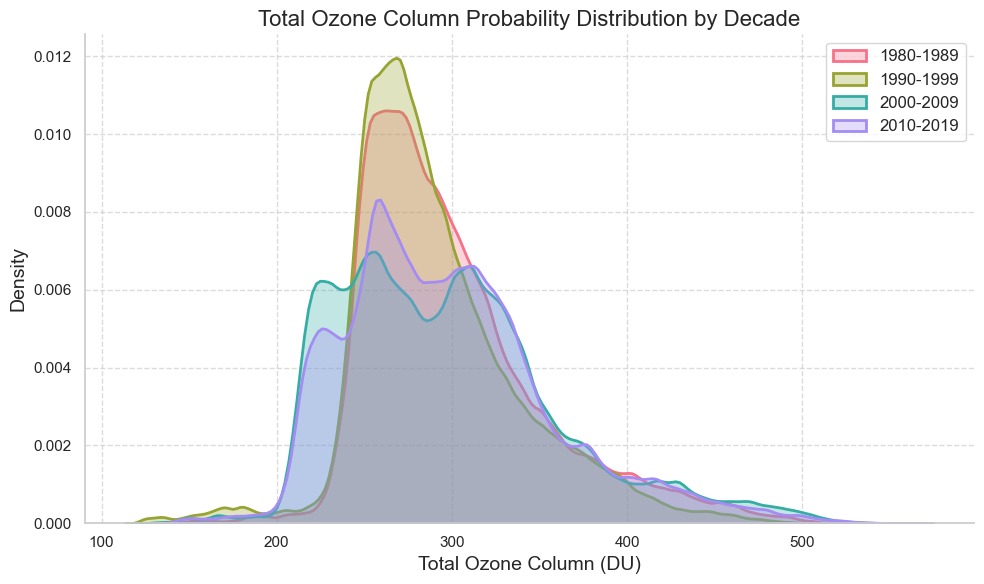

In [107]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(oz_annual['time']), freq='M')
oz_annual['time'] = xr.DataArray(time_values, dims='time')

# Define a function to extract the decade from a numeric year
def get_decade(year):
    return (year // 10) * 10

# Apply the function to each year in the dataset
oz_annual['decade'] = get_decade(oz_annual['time'].dt.year)

# Split time by decade
oz_decades = [oz_annual.sel(time=slice(f'{start}-01-01', f'{start + 9}-12-31')) for start in range(1980, 2020, 10)]

# Plot probability distribution curves for each decade with manually set colors
fig, ax = plt.subplots(figsize=(10, 6))

# Manually set colors for each decade
colors = sns.color_palette('husl', n_colors=len(oz_decades))

# KDE for each decade with shaded areas and manually set colors
for i, (decade, color) in enumerate(zip(oz_decades, colors)):
    data = decade['total_ozone_column'].values.flatten()
    start_year, end_year = int(decade['time'][0].dt.year), int(decade['time'][-1].dt.year)
    label = f'{start_year}-{end_year}'
    sns.kdeplot(data, label=label, ax=ax, color=color, linewidth=2, fill=True, alpha=0.3)

# Set plot aesthetics
ax.set_title('Total Ozone Column Probability Distribution by Decade', fontsize=16)
ax.set_xlabel('Total Ozone Column (DU)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Beautify the plot
sns.despine()
plt.tight_layout()

# Display the plot
plt.show()


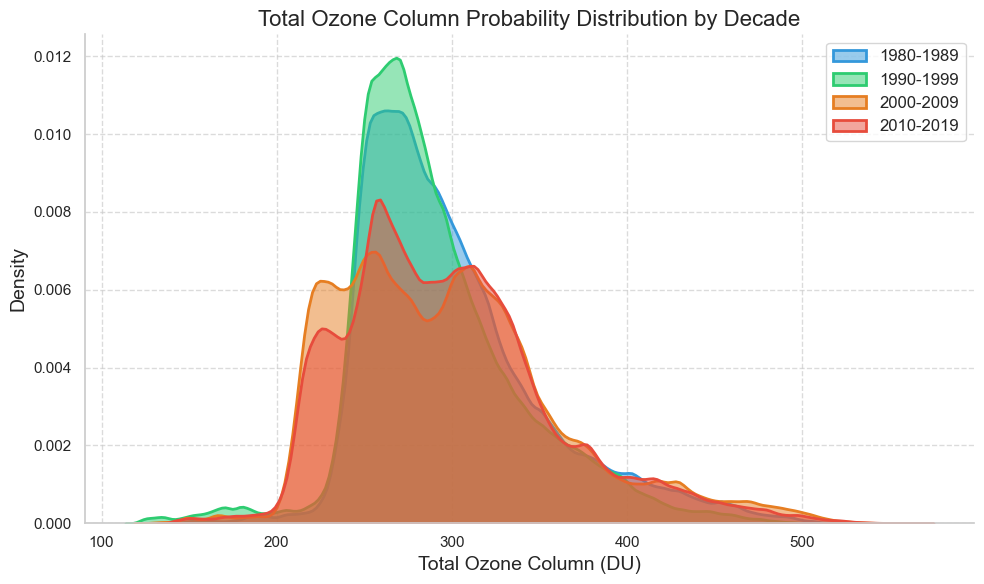

In [108]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(oz_annual['time']), freq='M')
oz_annual['time'] = xr.DataArray(time_values, dims='time')

# Define a function to extract the decade from a numeric year
def get_decade(year):
    return (year // 10) * 10

# Apply the function to each year in the dataset
oz_annual['decade'] = get_decade(oz_annual['time'].dt.year)

# Split time by decade
oz_decades = [oz_annual.sel(time=slice(f'{start}-01-01', f'{start + 9}-12-31')) for start in range(1980, 2020, 10)]

# Manually set colors for each decade
colors = ['#3498db', '#2ecc71', '#e67e22', '#e74c3c']


# Plot probability distribution curves for each decade with manually set colors
fig, ax = plt.subplots(figsize=(10, 6))

# KDE for each decade with shaded areas and manually set colors
for i, (decade, color) in enumerate(zip(oz_decades, colors)):
    data = decade['total_ozone_column'].values.flatten()
    start_year, end_year = int(decade['time'][0].dt.year), int(decade['time'][-1].dt.year)
    label = f'{start_year}-{end_year}'
    sns.kdeplot(data, label=label, ax=ax, color=color, linewidth=2, fill=True, alpha=0.5)

# Set plot aesthetics
ax.set_title('Total Ozone Column Probability Distribution by Decade', fontsize=16)
ax.set_xlabel('Total Ozone Column (DU)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Beautify the plot
sns.despine()
plt.tight_layout()

# Display the plot
plt.show()


In [ ]:
# value less than or equal to a given VALUE-S

In [ ]:
#Cumulative Distribution

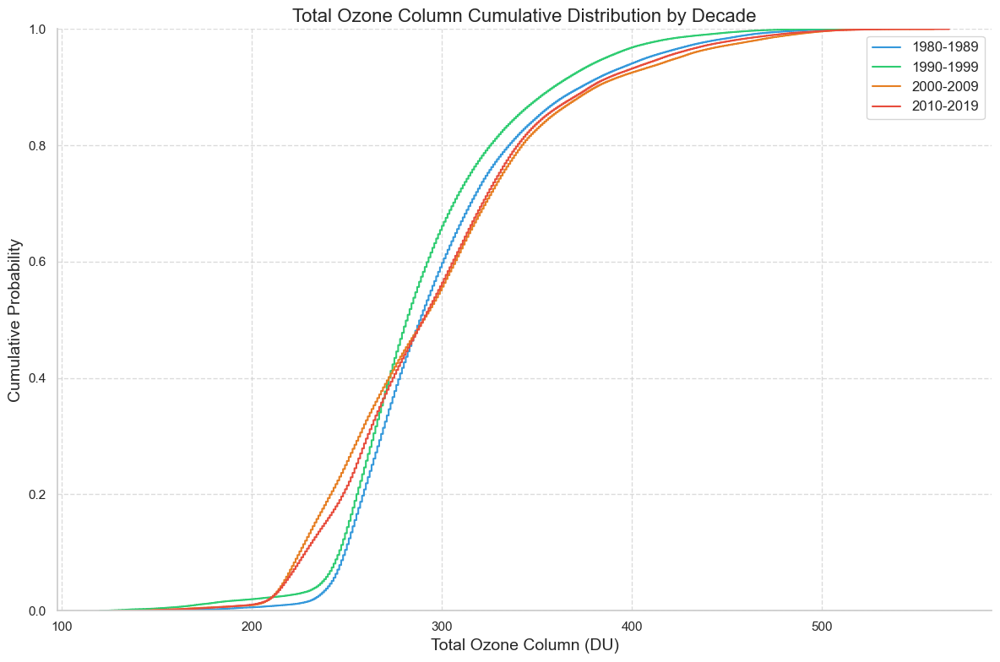

In [110]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(oz_annual['time']), freq='M')
oz_annual['time'] = xr.DataArray(time_values, dims='time')

# Define a function to extract the decade from a numeric year
def get_decade(year):
    return (year // 10) * 10

# Apply the function to each year in the dataset
oz_annual['decade'] = get_decade(oz_annual['time'].dt.year)

# Split time by decade
oz_decades = [oz_annual.sel(time=slice(f'{start}-01-01', f'{start + 9}-12-31')) for start in range(1980, 2020, 10)]

# Plot cumulative distribution plots for each decade
fig, ax = plt.subplots(figsize=(12, 8))

# Manually set colors for each decade
colors = ['#3498db', '#2ecc71', '#e67e22', '#e74c3c']

# Plot CDFs for each decade
for decade, color in zip(oz_decades, colors):
    data = decade['total_ozone_column'].values.flatten()
    sns.ecdfplot(data, label=f'{decade["time.year"][0].values}-{decade["time.year"][-1].values}', color=color)

# Set plot aesthetics
ax.set_title('Total Ozone Column Cumulative Distribution by Decade', fontsize=16)
ax.set_xlabel('Total Ozone Column (DU)', fontsize=14)
ax.set_ylabel('Cumulative Probability', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Beautify the plot
sns.despine()
plt.tight_layout()

# Display the plot
plt.show()


In [ ]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# Load the NetCDF file with decode_times=False
file_path = r'C:\Users\Subhadeep Maishal\Music\JUP\o3\ENSEMBLE_43year_monthly_ozone.nc'
oz_annual = xr.open_dataset(file_path, decode_times=False)

# Manually create a time coordinate based on the given information
time_values = pd.date_range(start='1980-01-15', periods=len(oz_annual['time']), freq='M')
oz_annual['time'] = xr.DataArray(time_values, dims='time')

# Define a function to extract the decade from a numeric year
def get_decade(year):
    return (year // 10) * 10

# Apply the function to each year in the dataset
oz_annual['decade'] = get_decade(oz_annual['time'].dt.year)

# Split time by decade
oz_decades = [oz_annual.sel(time=slice(f'{start}-01-01', f'{start + 9}-12-31')) for start in range(1980, 2020, 10)]

# Combine the data into a single DataFrame
df = oz_annual.to_dataframe().reset_index()

# Set the style for the plot
sns.set(style='whitegrid')

# Plot regression plots for each pair of decades
g = sns.PairGrid(df, hue='decade', palette=['#1f78b4', '#33a02c', '#fdbf6f', '#e31a1c'])
g.map(sns.regplot)
g.add_legend()

# Set plot aesthetics
g.fig.suptitle('Regression Plots for Ozone Levels by Decade', y=1.02, fontsize=16)

# Display the plot
plt.show()


KeyboardInterrupt: 